In [3]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Basic setup

In [10]:
import concord as ccd
import scanpy as sc
import torch
import warnings
from pathlib import Path
warnings.filterwarnings('ignore')

data_dir = Path('../data/celegans_binyamin/N2_outs')

adata = sc.read_10x_h5(data_dir / "filtered_feature_bc_matrix.h5")

In [9]:
import time
from pathlib import Path
proj_name = "concord_celN2"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
file_suffix = f"{time.strftime('%b%d-%H%M')}"
seed = 0

In [12]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [13]:
adata.layers['counts'][:20,:20].toarray()

array([[  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
       [  1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,  15.,   6.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   8.,  47.,  32.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,  22.,  67.,  54.,   0.,   0.],
       [  3.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   9.,   0.,   9.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   2.,   2.,  10.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   8.,  42.,  33.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0

## Run Concord

In [54]:
feature_list = ccd.ul.select_features(adata, n_top_features=10000, flavor='seurat_v3') # Loosely select features based on Seurat v3 method (so that enough information is preserved)

concord_args = {
        'adata': adata,
        'input_feature': feature_list,
        'batch_size':64, # Batch size for training, adjust as needed
        'latent_dim': 300, # Latent dimension size, adjust as needed
        'encoder_dims':[1000], # Encoder dimensions, recommended to be larger than latent_dim
        'use_decoder': False, # Whether to use a decoder, set to True if you want to use the decoder
        'decoder_dims':[1000], # Decoder dimensions, ignored if use_decoder is False
        'augmentation_mask_prob': 0.3, # Probability of masking features, recommended to be between 0.2 and 0.5
        'clr_temperature': 0.3, # Temperature for contrastive loss, recommended to be between 0.1 and 0.5
        'p_intra_knn': 0.3, # Probability of intra-neighborhood sampling, must be less than 0.5
        'sampler_knn': 300, # Size of neighbohood for intra-neighborhood sampling
        'p_intra_domain': .95, # Enrichment probability for intra-domain sampling, recommended to be between 0.85 and 1.0, note the lower the value, the more dataset-specific information (may contain batch effects) is preserved
        'n_epochs': 15, # Number of epochs for training, adjust as needed
        'verbose': True, # Verbosity level, set to True for more detailed output
        'inplace': False, # Whether to modify adata in place, if not you need to copy the obsm out of ccd.adata
        'seed': seed, # random seed for reproducibility
        'device': device, # Device for training, can be 'cpu', 'cuda', or 'mps'
        'save_dir': save_dir # Directory to save the model and results
    }

In [55]:
output_key = 'Concord'
cur_ccd = ccd.Concord(**concord_args)
cur_ccd.encode_adata(input_layer_key='X_log1p', output_key=output_key) # Result saved to ccd.adata.obsm[output_key]
adata.obsm = cur_ccd.adata.obsm # If not inplace, copy the obsm out of ccd.adata

Concord - WARNING - domain/batch information not found, all samples will be treated as from single domain/batch.
Concord - INFO - Encoder input dim: 10000
Concord - INFO - Model loaded to device: cpu
Concord - INFO - Total number of parameters: 10303908


FAISS not found. Using sklearn for k-NN computation.
You specified p_intra_domain as 0.95 but you only have one domain. Resetting p_intra_domain to 1.0.


p_intra_knn: 0.3
Concord - INFO - Starting epoch 1/15
Concord - INFO - Processing chunk 1/1 for epoch 1
Concord - INFO - Number of samples in train_dataloader: 12899


Epoch 0 Training: 201it [00:03, 52.08it/s, loss=2.63]

Concord - INFO - Epoch   0 | Train Loss: 3.03, MSE: 0.00, CLASS: 0.00, CONTRAST: 3.03, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 2/15
Concord - INFO - Processing chunk 1/1 for epoch 2
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 1 Training: 100%|██████████| 201/201 [00:03<00:00, 51.93it/s, loss=2.65]

Concord - INFO - Epoch   1 | Train Loss: 2.69, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.69, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 3/15
Concord - INFO - Processing chunk 1/1 for epoch 3
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 2 Training: 100%|██████████| 201/201 [00:03<00:00, 53.11it/s, loss=2.57]

Concord - INFO - Epoch   2 | Train Loss: 2.62, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.62, IMPORTANCE: 0.00


Concord - INFO - Starting epoch 4/15
Concord - INFO - Processing chunk 1/1 for epoch 4
Concord - INFO - Number of samples in train_dataloader: 12899


Epoch 3 Training: 100%|██████████| 201/201 [00:03<00:00, 52.89it/s, loss=2.47]

Concord - INFO - Epoch   3 | Train Loss: 2.56, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.56, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 5/15
Concord - INFO - Processing chunk 1/1 for epoch 5
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 4 Training: 100%|██████████| 201/201 [00:03<00:00, 53.50it/s, loss=2.51]

Concord - INFO - Epoch   4 | Train Loss: 2.52, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.52, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 6/15
Concord - INFO - Processing chunk 1/1 for epoch 6
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 5 Training: 100%|██████████| 201/201 [00:03<00:00, 53.23it/s, loss=2.63]

Concord - INFO - Epoch   5 | Train Loss: 2.48, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.48, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 7/15
Concord - INFO - Processing chunk 1/1 for epoch 7
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 6 Training: 100%|██████████| 201/201 [00:03<00:00, 53.01it/s, loss=2.37]

Concord - INFO - Epoch   6 | Train Loss: 2.46, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.46, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 8/15
Concord - INFO - Processing chunk 1/1 for epoch 8
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 7 Training: 100%|██████████| 201/201 [00:03<00:00, 52.00it/s, loss=2.55]

Concord - INFO - Epoch   7 | Train Loss: 2.43, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.43, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 9/15
Concord - INFO - Processing chunk 1/1 for epoch 9
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 8 Training: 100%|██████████| 201/201 [00:03<00:00, 51.01it/s, loss=2.33]

Concord - INFO - Epoch   8 | Train Loss: 2.42, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.42, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 10/15
Concord - INFO - Processing chunk 1/1 for epoch 10
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 9 Training: 100%|██████████| 201/201 [00:03<00:00, 51.10it/s, loss=2.47]

Concord - INFO - Epoch   9 | Train Loss: 2.41, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.41, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 11/15
Concord - INFO - Processing chunk 1/1 for epoch 11
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 10 Training: 100%|██████████| 201/201 [00:03<00:00, 51.61it/s, loss=2.44]

Concord - INFO - Epoch  10 | Train Loss: 2.39, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.39, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 12/15
Concord - INFO - Processing chunk 1/1 for epoch 12
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 11 Training: 100%|██████████| 201/201 [00:03<00:00, 51.63it/s, loss=2.43]

Concord - INFO - Epoch  11 | Train Loss: 2.40, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.40, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 13/15
Concord - INFO - Processing chunk 1/1 for epoch 13
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 12 Training: 100%|██████████| 201/201 [00:03<00:00, 50.59it/s, loss=2.44]

Concord - INFO - Epoch  12 | Train Loss: 2.38, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.38, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 14/15
Concord - INFO - Processing chunk 1/1 for epoch 14
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 13 Training: 100%|██████████| 201/201 [00:03<00:00, 50.80it/s, loss=2.43]

Concord - INFO - Epoch  13 | Train Loss: 2.38, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.38, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 15/15
Concord - INFO - Processing chunk 1/1 for epoch 15
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 14 Training: 100%|██████████| 201/201 [00:04<00:00, 49.85it/s, loss=2.38]

Concord - INFO - Epoch  14 | Train Loss: 2.37, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.37, IMPORTANCE: 0.00


Concord - INFO - Model saved to ../save/dev_concord_celN2-Jun12/final_model_Jun12-1541.pt
Concord - INFO - Final model saved at: ../save/dev_concord_celN2-Jun12/final_model_Jun12-1541.pt; Configuration saved at: ../save/dev_concord_celN2-Jun12/config_Jun12-1541.json.
Concord - INFO - Predicting for chunk 1/1


In [56]:
sc.pp.neighbors(adata, use_rep=output_key, n_neighbors=30, knn=True)
sc.tl.leiden(adata, resolution=0.5, key_added=f'leiden_{output_key}')

In [ ]:
from compute_cel_time import compute_time
import pandas as pd
bulk = pd.read_csv("../resources/ce_time_compute/whole.embryo.interval.timecourse.tsv", sep="\t", index_col=0)

# replace the first and second column names with the new names "mpfc_000""mpfc_005"
# You cannot assign to bulk.columns[0:2] directly because pandas Index does not support item assignment.
# Instead, create a new list of column names and assign it back to bulk.columns.
cols = list(bulk.columns)
cols[0] = "mpfc_000"
cols[1] = "mpfc_005"
bulk.columns = cols
ref_time = bulk.columns.str.replace("mpfc_", "").astype(int)
adata = compute_time(
    adata,
    bulk,
    ref_time,
    name="BestTime_Yanai",
    pseudoCountSingle=1,
    pseudoCountBulk=1,
    minAutoCor=0.6,
    minSD=1.5,
    detect_low=1,
    detect_high=7,
    span=0.5,
)
adata.obs['raw.embryo.time'] = adata.obs['BestTime_Yanai'].copy()

Concord - INFO - UMAP embedding stored in adata.obsm['Concord_UMAP']


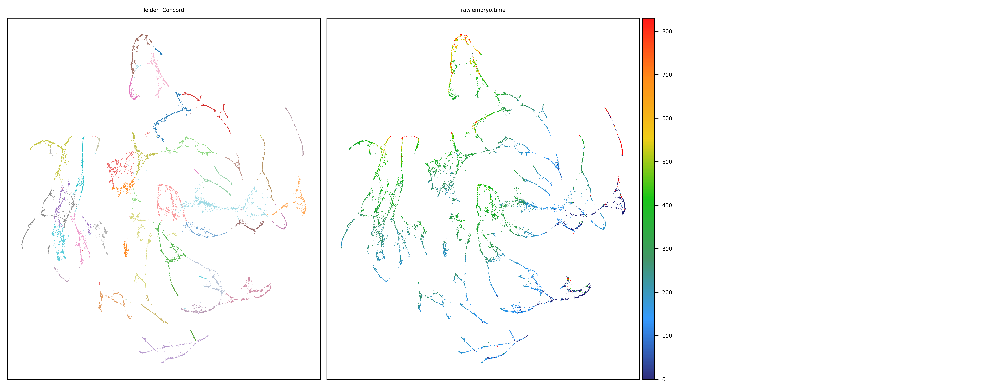

In [57]:
basis = output_key
ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
show_basis = basis + '_UMAP'
#show_cols = ['cell.type', 'raw.embryo.time', "lineage"]
show_cols = [f'leiden_{output_key}', 'raw.embryo.time']
pal = {f'leiden_{output_key}':'tab20', 'raw.embryo.time': 'BlueGreenRed'}
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(13,5), dpi=600, ncols=3, font_size=5, point_size=2, legend_loc=None,
    pal = pal,
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [58]:
ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
import plotly.io as pio
pio.renderers.default = 'notebook'
for col in show_cols:
    show_basis = f'{basis}_UMAP_3D'
    ccd.pl.plot_embedding_3d(
            adata, basis=show_basis, color_by=col,
            pal = pal[col],
            save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.html',
            point_size=1, opacity=0.8, width=1500, height=1000
        )

Concord - INFO - UMAP embedding stored in adata.obsm['Concord_UMAP_3D']


In [ ]:
adata.write_h5ad(data_dir / f"{proj_name}_{file_suffix}.h5ad") # Save the adata object with the encoded embeddings
print(f"Saved adata to {data_dir / f'{proj_name}_{file_suffix}.h5ad'}")
ccd.ul.anndata_to_viscello(adata, data_dir / f"cello_{proj_name}_{file_suffix}", project_name = proj_name, organism='hsa')
print(f"Saved viscello to {data_dir / f'cello_{proj_name}_{file_suffix}'}")

Saved adata to ../data/celegans_binyamin/N2_outs/concord_celN2_Jun12-1457.h5ad
Concord - INFO - Normalized expression data (adata.layers['X_log1p']) not found. Renormalize and log transforming.
VisCello project created at ../data/celegans_binyamin/N2_outs/cello_concord_celN2_Jun12-1457
Saved viscello to ../data/celegans_binyamin/N2_outs/cello_concord_celN2_Jun12-1457.h5ad
